In [27]:
# Geopandas es una extensión para Pandas que permite trabajar
# con datos geoespaciales.
# Shapely permite crear y modificar datos vectoriales.

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt

import geopandas as gpd

In [64]:
# Leemos un archivo tipo shapefile.

# Dirección de los datos.
path = "../Material/Clases/Clase 6/"

# Nombre del archivo.
fname = "rha250kcw_sin_islas.shp"

gdf = gpd.read_file(path + fname)

gdf.head()

# Geopandas agrega un tipo de columna especial llamada geometry.

,AREA,PERIMETER,COV_,COV_ID,CLAVE,ORG_CUENCA,CLV_OC,SHAPE_AREA,SHAPE_LEN,geometry
0,1.450592e+11,3.944349e+06,2,1,1,Península de Baja California,I,147348379405,5183580.98666,"POLYGON ((1074639.006 2330111.110, 1074636.000..."
1,2.053648e+11,3.278104e+06,6,2,2,Noroeste,II,206616269151,3587919.58619,"POLYGON ((1288972.734 2323826.343, 1288992.739..."
2,1.504927e+11,3.819124e+06,81,71,3,Pacífico Norte,III,150500350397,3850429.85701,"POLYGON ((1926559.600 1775631.790, 1926620.357..."
3,1.188371e+11,3.910981e+06,277,244,4,Balsas,IV,118832035844,3910888.79235,"POLYGON ((2444159.145 868207.651, 2444150.641 ..."
4,7.773756e+10,3.302161e+06,359,358,5,Pacífico Sur,V,77735750423.8,3306177.84114,"POLYGON ((2579195.615 672740.569, 2579229.368 ..."


In [65]:
# Al trabajar datos geoespaciales es fundamental conocer la proyección.

gdf.crs

# Tenemos la cónica conforme de Lambert y con ejes en METROS,
# por lo que se pueden calcular distancias y áreas.

<Projected CRS: PROJCS["Mex_INEGI_Lambert_Conformal_Conic",GEOGCS[ ...>
Name: Mex_INEGI_Lambert_Conformal_Conic
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Lambert Conic Conformal (2SP)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [66]:
# Creamos otro GeoDataframe con WGS84 con ejes elipsoidales.
# Transformamos coordenadas.
# El código EPSG:4325 indica el tipo de proyección.
# Visitar epsg.io

gdf_2 = gdf.to_crs(epsg = 4326)

gdf_2.head()
# Observen las coordenadas en la columna de geometría.

,AREA,PERIMETER,COV_,COV_ID,CLAVE,ORG_CUENCA,CLV_OC,SHAPE_AREA,SHAPE_LEN,geometry
0,1.450592e+11,3.944349e+06,2,1,1,Península de Baja California,I,147348379405,5183580.98666,"POLYGON ((-117.07177 32.36348, -117.07181 32.3..."
1,2.053648e+11,3.278104e+06,6,2,2,Noroeste,II,206616269151,3587919.58619,"POLYGON ((-114.81259 32.49378, -114.81237 32.4..."
2,1.504927e+11,3.819124e+06,81,71,3,Pacífico Norte,III,150500350397,3850429.85701,"POLYGON ((-107.84287 27.93934, -107.84218 27.9..."
3,1.188371e+11,3.910981e+06,277,244,4,Balsas,IV,118832035844,3910888.79235,"POLYGON ((-102.53479 19.81362, -102.53487 19.8..."
4,7.773756e+10,3.302161e+06,359,358,5,Pacífico Sur,V,77735750423.8,3306177.84114,"POLYGON ((-101.25132 18.04288, -101.25100 18.0..."


In [67]:
# Calcular área.

print(gdf.area)
print()

print(gdf_2.area)

0     1.450592e+11
1     2.053648e+11
2     1.504927e+11
3     1.188371e+11
4     7.773756e+10
5     3.781865e+11
6     2.004401e+11
7     1.887800e+11
8     1.258489e+11
9     1.044467e+11
10    1.014826e+11
11    1.369023e+11
12    1.631248e+10
dtype: float64

0     13.380497
1     19.109634
2     13.576108
3     10.204611
4      6.568041
5     34.871069
6     18.061503
7     16.511622
8     11.166451
9      8.964858
10     8.584586
11    11.864603
12     1.416313
dtype: float64


/var/folders/td/smccb02154l21rhgckcmbs940000gn/T/ipykernel_2235/3158010758.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  print(gdf_2.area)


In [68]:
# Obtener borde, perímetro, y centroide.

gdf["borde"] = gdf.boundary
gdf["perimetro"] = gdf.length
gdf["centroide"] = gdf.centroid

gdf.head()

,AREA,PERIMETER,COV_,COV_ID,CLAVE,ORG_CUENCA,CLV_OC,SHAPE_AREA,SHAPE_LEN,geometry,borde,perimetro,centroide
0,1.450592e+11,3.944349e+06,2,1,1,Península de Baja California,I,147348379405,5183580.98666,"POLYGON ((1074639.006 2330111.110, 1074636.000...","LINESTRING (1074639.006 2330111.110, 1074636.0...",3.944349e+06,POINT (1371818.096 1842012.193)
1,2.053648e+11,3.278104e+06,6,2,2,Noroeste,II,206616269151,3587919.58619,"POLYGON ((1288972.734 2323826.343, 1288992.739...","LINESTRING (1288972.734 2323826.343, 1288992.7...",3.278104e+06,POINT (1681617.147 1968202.064)
2,1.504927e+11,3.819124e+06,81,71,3,Pacífico Norte,III,150500350397,3850429.85701,"POLYGON ((1926559.600 1775631.790, 1926620.357...","LINESTRING (1926559.600 1775631.790, 1926620.3...",3.819124e+06,POINT (2051600.230 1426808.841)
3,1.188371e+11,3.910981e+06,277,244,4,Balsas,IV,118832035844,3910888.79235,"POLYGON ((2444159.145 868207.651, 2444150.641 ...","LINESTRING (2444159.145 868207.651, 2444150.64...",3.910981e+06,POINT (2711524.070 731118.291)
4,7.773756e+10,3.302161e+06,359,358,5,Pacífico Sur,V,77735750423.8,3306177.84114,"POLYGON ((2579195.615 672740.569, 2579229.368 ...","MULTILINESTRING ((2579195.615 672740.569, 2579...",3.302161e+06,POINT (2975789.410 536169.872)


In [69]:
# podemos medir la distancia entre todos los centroides
# y el centroide de la primera entrada.

gdf["distancia"] = gdf["centroide"].distance( gdf["centroide"].iloc[0] )

gdf.head()

,AREA,PERIMETER,COV_,COV_ID,CLAVE,ORG_CUENCA,CLV_OC,SHAPE_AREA,SHAPE_LEN,geometry,borde,perimetro,centroide,distancia
0,1.450592e+11,3.944349e+06,2,1,1,Península de Baja California,I,147348379405,5183580.98666,"POLYGON ((1074639.006 2330111.110, 1074636.000...","LINESTRING (1074639.006 2330111.110, 1074636.0...",3.944349e+06,POINT (1371818.096 1842012.193),0.000000e+00
1,2.053648e+11,3.278104e+06,6,2,2,Noroeste,II,206616269151,3587919.58619,"POLYGON ((1288972.734 2323826.343, 1288992.739...","LINESTRING (1288972.734 2323826.343, 1288992.7...",3.278104e+06,POINT (1681617.147 1968202.064),3.345136e+05
2,1.504927e+11,3.819124e+06,81,71,3,Pacífico Norte,III,150500350397,3850429.85701,"POLYGON ((1926559.600 1775631.790, 1926620.357...","LINESTRING (1926559.600 1775631.790, 1926620.3...",3.819124e+06,POINT (2051600.230 1426808.841),7.965536e+05
3,1.188371e+11,3.910981e+06,277,244,4,Balsas,IV,118832035844,3910888.79235,"POLYGON ((2444159.145 868207.651, 2444150.641 ...","LINESTRING (2444159.145 868207.651, 2444150.64...",3.910981e+06,POINT (2711524.070 731118.291),1.740373e+06
4,7.773756e+10,3.302161e+06,359,358,5,Pacífico Sur,V,77735750423.8,3306177.84114,"POLYGON ((2579195.615 672740.569, 2579229.368 ...","MULTILINESTRING ((2579195.615 672740.569, 2579...",3.302161e+06,POINT (2975789.410 536169.872),2.068320e+06


In [70]:
# y podemos utilizar las herramientas comunes de pandas.

gdf["distancia"].mean()

1454061.2047348453

In [71]:
gdf.iloc[:, -4]

0     LINESTRING (1074639.006 2330111.110, 1074636.0...
1     LINESTRING (1288972.734 2323826.343, 1288992.7...
2     LINESTRING (1926559.600 1775631.790, 1926620.3...
3     LINESTRING (2444159.145 868207.651, 2444150.64...
4     MULTILINESTRING ((2579195.615 672740.569, 2579...
5     LINESTRING (1854726.926 2155423.529, 1860746.5...
6     LINESTRING (2234529.297 1598680.247, 2234543.5...
7     LINESTRING (2316517.958 1253303.562, 2316540.4...
8     LINESTRING (2949977.292 1451255.350, 2949905.0...
9     LINESTRING (2949786.494 1026183.616, 2949887.7...
10    LINESTRING (3501508.158 772545.566, 3501785.65...
11    LINESTRING (4031563.518 1140751.532, 4031564.2...
12    LINESTRING (2805958.986 976293.739, 2806077.73...
Name: borde, dtype: geometry

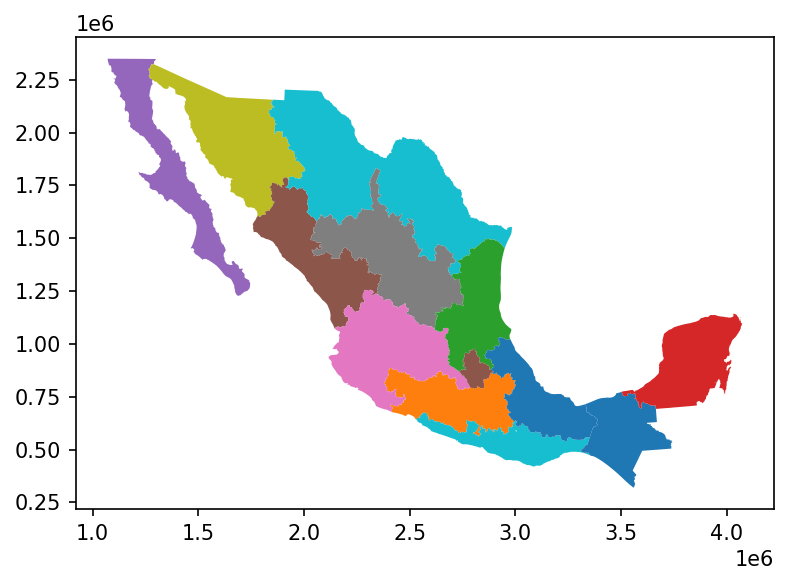

In [73]:
# Graficar es muy sencillo.

# Incializamos gráfica.
fig, ax = plt.subplots()
fig.set_facecolor("w")
fig.set_dpi(150) 

gdf.plot("SHAPE_AREA", ax = ax)

fig.tight_layout()

In [74]:
# Podemos hacer mapas interactivos.

gdf.explore("SHAPE_AREA", legend = False)

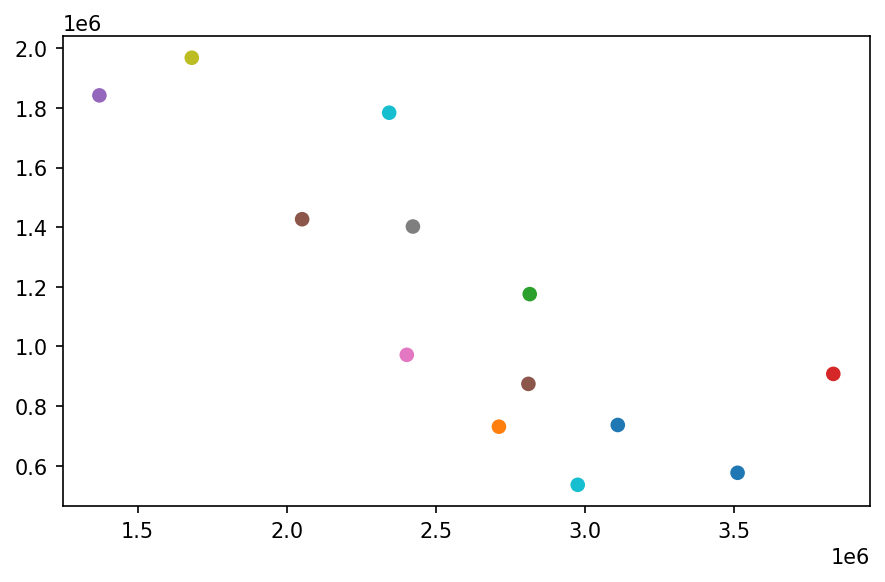

In [80]:
# Graficar diferentes elementos.

# Incializamos gráfica.
fig, ax = plt.subplots()
fig.set_facecolor("w")
fig.set_dpi(150) 

# Cambiamos la columna de geometría principal.
gdf = gdf.set_geometry("centroide")
gdf.plot("SHAPE_AREA", ax = ax)

fig.tight_layout()
plt.show()

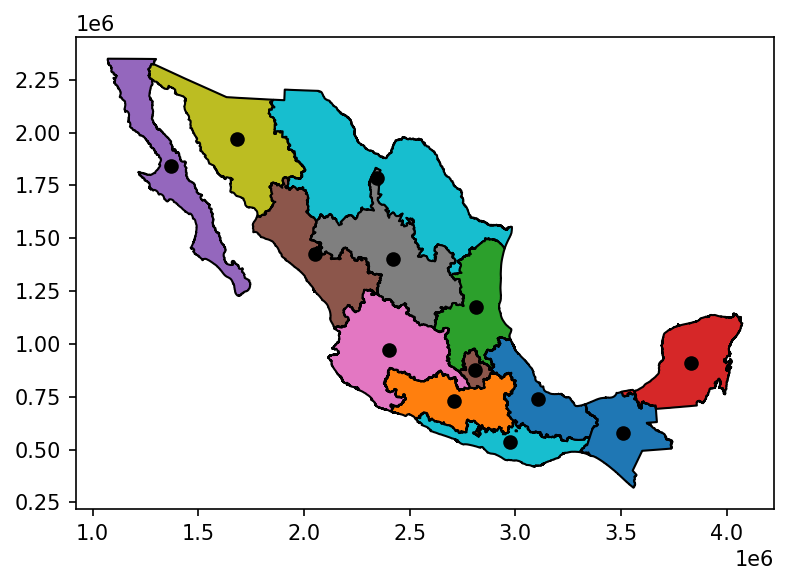

In [83]:
# Graficar diferentes elementos a la vez.

# Incializamos gráfica.
fig, ax = plt.subplots()
fig.set_facecolor("w")
fig.set_dpi(150) 

gdf.set_geometry("geometry").plot("SHAPE_AREA", ax = ax, edgecolor = "k")
gdf["centroide"].plot(color = "black", ax = ax)

fig.tight_layout()
plt.show()

In [84]:
# regresamos a la geoserie original.
gdf = gdf.set_geometry("geometry")

In [85]:
gdf_2

,AREA,PERIMETER,COV_,COV_ID,CLAVE,ORG_CUENCA,CLV_OC,SHAPE_AREA,SHAPE_LEN,geometry
0,1.450592e+11,3.944349e+06,2,1,1,Península de Baja California,I,147348379405,5183580.98666,"POLYGON ((-117.07177 32.36348, -117.07181 32.3..."
1,2.053648e+11,3.278104e+06,6,2,2,Noroeste,II,206616269151,3587919.58619,"POLYGON ((-114.81259 32.49378, -114.81237 32.4..."
2,1.504927e+11,3.819124e+06,81,71,3,Pacífico Norte,III,150500350397,3850429.85701,"POLYGON ((-107.84287 27.93934, -107.84218 27.9..."
3,1.188371e+11,3.910981e+06,277,244,4,Balsas,IV,118832035844,3910888.79235,"POLYGON ((-102.53479 19.81362, -102.53487 19.8..."
4,7.773756e+10,3.302161e+06,359,358,5,Pacífico Sur,V,77735750423.8,3306177.84114,"POLYGON ((-101.25132 18.04288, -101.25100 18.0..."
5,3.781865e+11,6.638006e+06,12,9,6,Río Bravo,VI,378177518346,6637924.24503,"POLYGON ((-108.75595 31.33248, -108.69292 31.3..."
6,2.004401e+11,4.972292e+06,71,67,7,Cuencas Centrales del Norte,VII,200442895395,4972319.40466,"POLYGON ((-104.67249 26.42033, -104.67234 26.4..."
7,1.887800e+11,4.267071e+06,149,148,8,Lerma Santiago Pacífico,VIII,189164902561,4537769.84154,"POLYGON ((-103.80350 23.29850, -103.80327 23.2..."
8,1.258489e+11,3.334383e+06,135,131,9,Golfo Norte,IX,125847426777,3336393.48127,"POLYGON ((-97.51743 25.04195, -97.51822 25.039..."
9,1.044467e+11,2.941989e+06,232,225,10,Golfo Centro,x,104469586705,2965591.51675,"POLYGON ((-97.64779 21.18538, -97.64680 21.185..."


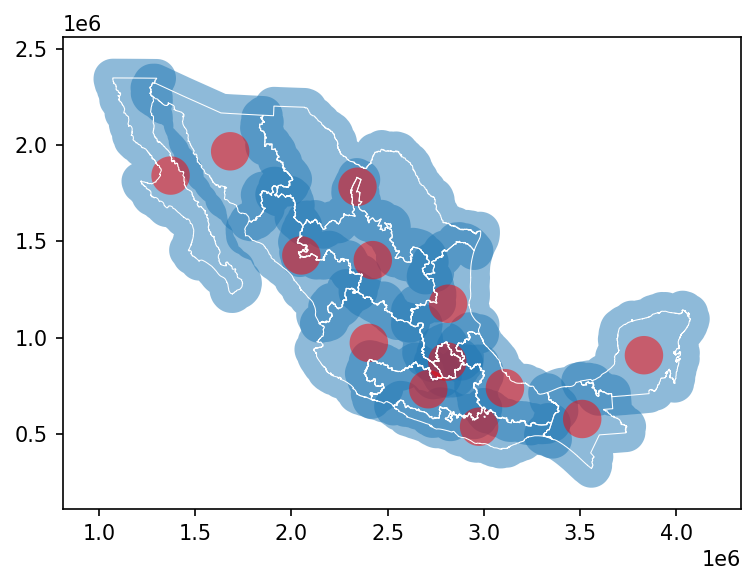

In [86]:
# Amortiguamiento.
gdf["buffer"] = gdf.buffer(100000)
gdf["buffer_centroide"] = gdf["centroide"].buffer(100000)

# Incializamos gráfica.
fig, ax = plt.subplots()
fig.set_facecolor("w")
fig.set_dpi(150) 

gdf["buffer"].plot(alpha = 0.5, ax = ax)
gdf["buffer_centroide"].plot(color = "r", alpha = 0.5, ax = ax)
gdf["borde"].plot(color = "white", linewidth = 0.5, ax = ax)

fig.tight_layout()

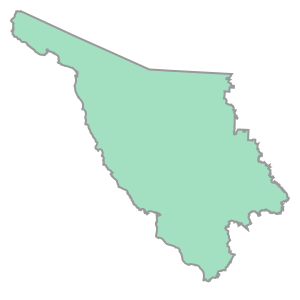

In [87]:
# Visualizar una geometría.

gdf.loc[1, "geometry"]

In [88]:
# Intersección con una sola geometría.

gdf["buffer"].intersects( gdf.loc[1, "geometry"] )

0      True
1      True
2      True
3     False
4     False
5      True
6     False
7     False
8     False
9     False
10    False
11    False
12    False
dtype: bool

In [89]:
# Intersección entre columnas.

gdf["buffer"].intersects( gdf["geometry"] )

0     True
1     True
2     True
3     True
4     True
5     True
6     True
7     True
8     True
9     True
10    True
11    True
12    True
dtype: bool

In [90]:
# El centroide con buffer está totalmente dentro o no.

gdf["dentro"] = gdf["buffer_centroide"].within( gdf )
gdf.head()

,AREA,PERIMETER,COV_,COV_ID,CLAVE,ORG_CUENCA,CLV_OC,SHAPE_AREA,SHAPE_LEN,geometry,borde,perimetro,centroide,distancia,buffer,buffer_centroide,dentro
0,1.450592e+11,3.944349e+06,2,1,1,Península de Baja California,I,147348379405,5183580.98666,"POLYGON ((1074639.006 2330111.110, 1074636.000...","LINESTRING (1074639.006 2330111.110, 1074636.0...",3.944349e+06,POINT (1371818.096 1842012.193),0.000000e+00,"POLYGON ((971545.508 2336893.644, 971193.687 2...","POLYGON ((1471818.096 1842012.193, 1471336.569...",False
1,2.053648e+11,3.278104e+06,6,2,2,Noroeste,II,206616269151,3587919.58619,"POLYGON ((1288972.734 2323826.343, 1288992.739...","LINESTRING (1288972.734 2323826.343, 1288992.7...",3.278104e+06,POINT (1681617.147 1968202.064),3.345136e+05,"POLYGON ((1165369.152 2280220.546, 1165340.016...","POLYGON ((1781617.147 1968202.064, 1781135.620...",True
2,1.504927e+11,3.819124e+06,81,71,3,Pacífico Norte,III,150500350397,3850429.85701,"POLYGON ((1926559.600 1775631.790, 1926620.357...","LINESTRING (1926559.600 1775631.790, 1926620.3...",3.819124e+06,POINT (2051600.230 1426808.841),7.965536e+05,"POLYGON ((1658483.129 1552262.045, 1658260.485...","POLYGON ((2151600.230 1426808.841, 2151118.703...",False
3,1.188371e+11,3.910981e+06,277,244,4,Balsas,IV,118832035844,3910888.79235,"POLYGON ((2444159.145 868207.651, 2444150.641 ...","LINESTRING (2444159.145 868207.651, 2444150.64...",3.910981e+06,POINT (2711524.070 731118.291),1.740373e+06,"POLYGON ((2942447.052 471864.995, 2939730.708 ...","POLYGON ((2811524.070 731118.291, 2811042.543 ...",False
4,7.773756e+10,3.302161e+06,359,358,5,Pacífico Sur,V,77735750423.8,3306177.84114,"POLYGON ((2579195.615 672740.569, 2579229.368 ...","MULTILINESTRING ((2579195.615 672740.569, 2579...",3.302161e+06,POINT (2975789.410 536169.872),2.068320e+06,"POLYGON ((2444558.129 694324.300, 2446074.730 ...","POLYGON ((3075789.410 536169.872, 3075307.882 ...",False


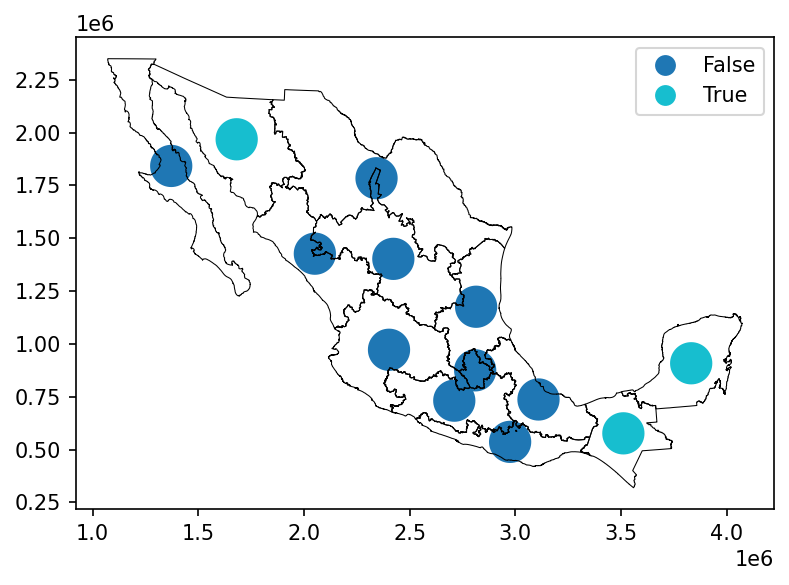

In [91]:
# Graficamos para confirmar

# Incializamos gráfica.
fig, ax = plt.subplots()
fig.set_facecolor("w")
fig.set_dpi(150) 

gdf.set_geometry("buffer_centroide").plot(
    "dentro", legend = True, categorical = True,
    legend_kwds = {"loc": "upper right"}, ax = ax)
gdf["borde"].plot(color = "black", linewidth = 0.5, ax = ax)

fig.tight_layout()

1    3.136548e+10
dtype: float64


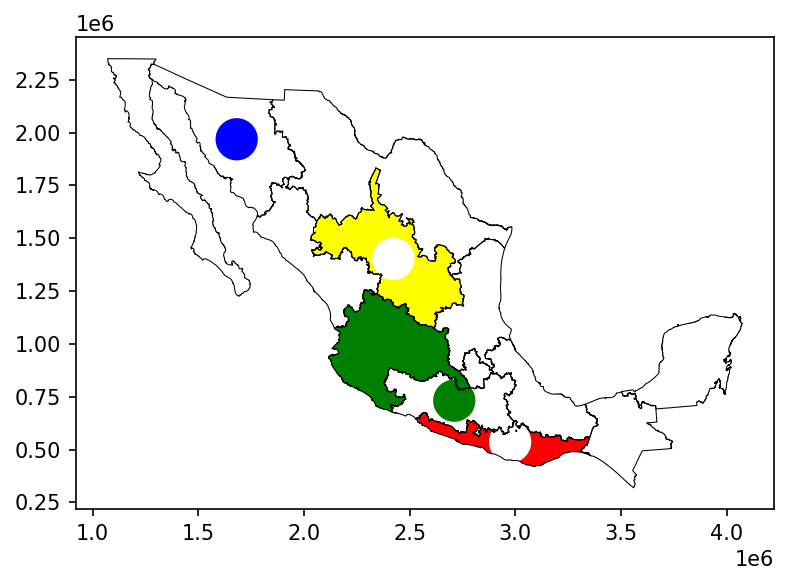

In [92]:
# Podemos hacer operaciones entre áreas.

# Incializamos gráfica.
fig, ax = plt.subplots()
fig.set_facecolor("w")
fig.set_dpi(150) 

gdf["borde"].plot(color = "black", linewidth = 0.5, ax = ax)

# Intersección.
# El 1:1 es para seguir teniendo una GeoSeries.
# Poner solo 1 nos daría el elemtno dentro de la tabla,
# que es un polígono de Shapely.
inter = gdf.loc[1:1, "geometry"].intersection(
    gdf.loc[1:1, "buffer_centroide"], align = False )
inter.plot(color = "blue", ax = ax)
print(inter.area)

# Unión.
union = gdf.loc[7:7, "geometry"].union(
    gdf.loc[3:3, "buffer_centroide"], align = False )
union.plot(color = "green", ax = ax)

# Diferencia.
diff = gdf.loc[4:4, "geometry"].difference(
    gdf.loc[4:4, "buffer_centroide"], align = False )
diff.plot(color = "red", ax = ax)

# Diferencia simétrica.
s_diff = gdf.loc[6:6, "geometry"].symmetric_difference(
    gdf.loc[6:6, "buffer_centroide"], align = False )
s_diff.plot(color = "yellow", ax = ax)

fig.tight_layout()

In [ ]:
# Carga la división política estatal.
# Obten la distancia de todos los centroides entre sí.
# Crea un buffer de 100 km alrededor de cada estado.
# Para cada estado, revisa cuáles otros quedan dentro del centroide.